<a href="https://colab.research.google.com/github/JosePabloGFnl/Tensorflow-Practice/blob/main/CatDogImageClassification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#a small project that classifies an image as a dog or cat
#we are using this dataset:
#https://www.tensorflow.org/datasets/catalog/cats_vs_dogs?hl=es-419

In [ ]:
#first, we look for a dataset for our training data
#then, we look for an architecture for our NN (dense, convolutional, etc)
#how many layers will we use? how many neurons in each layer?
#export the model for tensorflowjs

In [2]:
import tensorflow as tf
import tensorflow_datasets as tfds

datos, metadatos = tfds.load('cats_vs_dogs', as_supervised=True, with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

0 examples [00:00, ? examples/s]

Shuffling and writing examples to /root/tensorflow_datasets/cats_vs_dogs/4.0.0.incompleteNCZ6XN/cats_vs_dogs-train.tfrecord


  0%|          | 0/23262 [00:00<?, ? examples/s]

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.0. Subsequent calls will reuse this data.


In [3]:
#print variable metadatos to analyze the set
metadatos

tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    version=4.0.0,
    description='A large set of images of cats and dogs.There are 1738 corrupted images that are dropped.',
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=tf.uint8),
        'image/filename': Text(shape=(), dtype=tf.string),
        'label': ClassLabel(shape=(), dtype=tf.int64, num_classes=2),
    }),
    total_num_examples=23262,
    splits={
        'train': 23262,
    },
    supervised_keys=('image', 'label'),
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, Jared},
    title = {Asirra: A CAPTCHA that Exploits Interest-Aligned Manual Image Categorization},
    booktitle = {Proceedings of 14th ACM Conference on Computer and Communications Security (CCS)},
    ye

,image,label
0,,1 (dog)
1,,1 (dog)
2,,1 (dog)
3,,0 (cat)
4,,1 (dog)

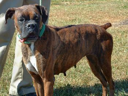
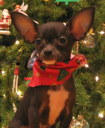
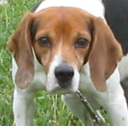
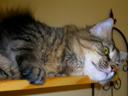
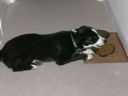

In [4]:
tfds.as_dataframe(datos['train'].take(5), metadatos) #to see 5 elements in the dataset

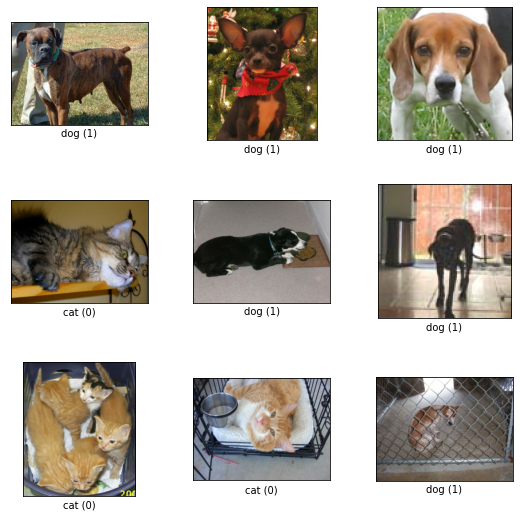

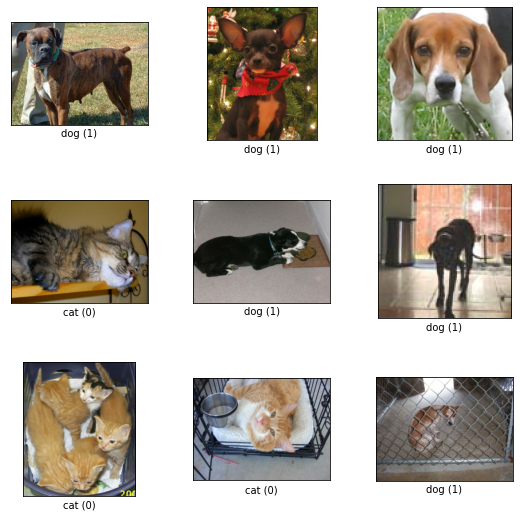

In [5]:
tfds.show_examples(datos['train'], metadatos)

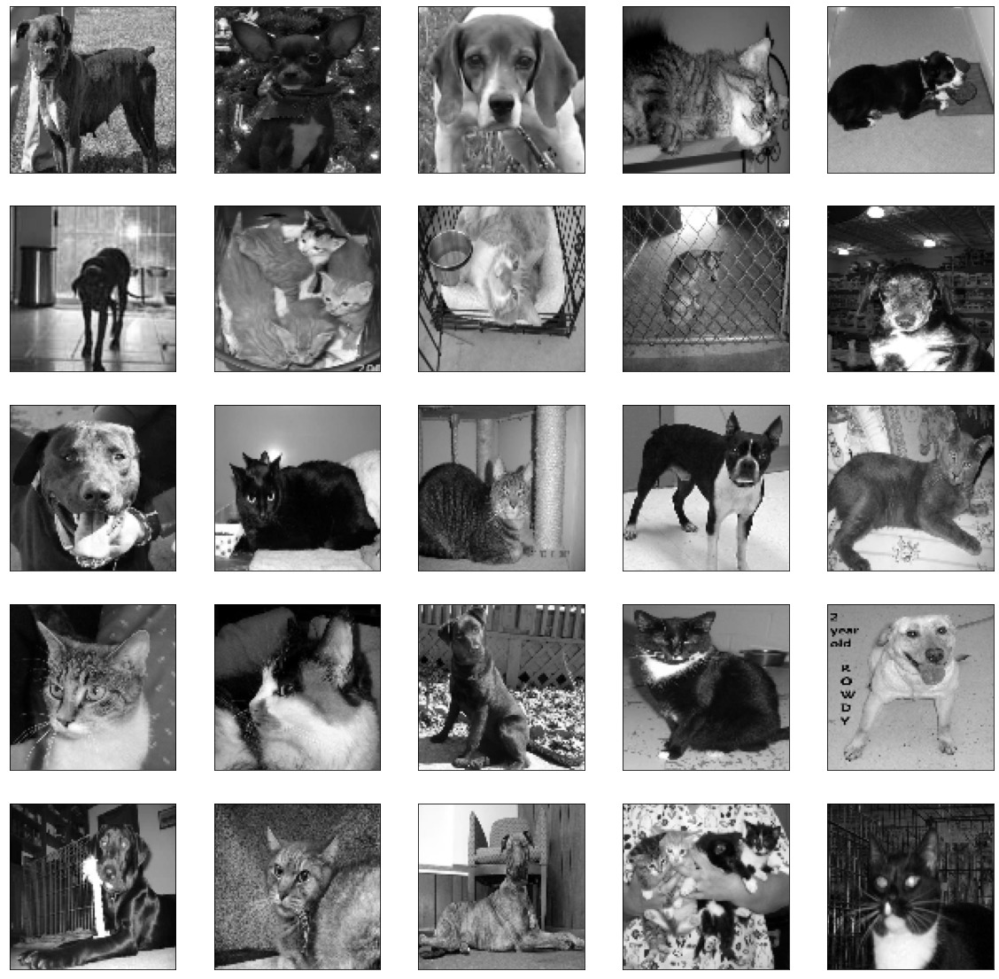

In [12]:
#to see how our set will look like
import matplotlib.pyplot as plt
import cv2 #we'll use this to redimension each image to a certain size

plt.figure(figsize=(20,20)) #to configure image sizes for printing

TAMANO_IMG=100 #we don't want the quality to be too high or too low

for i, (imagen, etiqueta) in enumerate(datos['train'].take(25)):
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG)) #function for cv2 library
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY) #to make them black and white
  plt.subplot(5, 5, i+1) #to show several, (row, columns)
  plt.xticks([])#this is used to now show the size numbers in each image
  plt.yticks([])
  plt.imshow(imagen, cmap='gray') #cmap is used for cvtColor

In [14]:
datos_entrenamiento = []

In [15]:
for i, (imagen, etiqueta) in enumerate(datos['train']): #every data
#our parameters we experimented with
  imagen = cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG)) 
  imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  imagen = imagen.reshape(TAMANO_IMG, TAMANO_IMG, 1) #size 100, 100, 1
  datos_entrenamiento.append([imagen, etiqueta]) #to add every data in our array

In [16]:
#to see every value in each pixel on an image
datos_entrenamiento[0]

[array([[[242],
         [190],
         [105],
         ...,
         [189],
         [195],
         [143]],
 
        [[230],
         [130],
         [ 88],
         ...,
         [188],
         [179],
         [187]],
 
        [[170],
         [ 93],
         [ 84],
         ...,
         [131],
         [158],
         [168]],
 
        ...,
 
        [[112],
         [173],
         [164],
         ...,
         [141],
         [152],
         [119]],
 
        [[140],
         [151],
         [172],
         ...,
         [ 96],
         [150],
         [152]],
 
        [[ 92],
         [112],
         [168],
         ...,
         [ 44],
         [ 52],
         [ 47]]], dtype=uint8), <tf.Tensor: shape=(), dtype=int64, numpy=1>]

In [17]:
len(datos_entrenamiento)

23262

In [18]:
x = [] #input images (pixels)
y = [] #tags (cat or dog)

for imagen, etiqueta in datos_entrenamiento:
  x.append(imagen)
  y.append(etiqueta)

In [21]:
x

array([[[[0.94901961],
         [0.74509804],
         [0.41176471],
         ...,
         [0.74117647],
         [0.76470588],
         [0.56078431]],

        [[0.90196078],
         [0.50980392],
         [0.34509804],
         ...,
         [0.7372549 ],
         [0.70196078],
         [0.73333333]],

        [[0.66666667],
         [0.36470588],
         [0.32941176],
         ...,
         [0.51372549],
         [0.61960784],
         [0.65882353]],

        ...,

        [[0.43921569],
         [0.67843137],
         [0.64313725],
         ...,
         [0.55294118],
         [0.59607843],
         [0.46666667]],

        [[0.54901961],
         [0.59215686],
         [0.6745098 ],
         ...,
         [0.37647059],
         [0.58823529],
         [0.59607843]],

        [[0.36078431],
         [0.43921569],
         [0.65882353],
         ...,
         [0.17254902],
         [0.20392157],
         [0.18431373]]],


       [[[0.57254902],
         [0.45098039],
         [0.36

In [20]:
import numpy as np

x = np.array(x).astype(float) / 255 #normalize data

In [24]:
y

array([1, 1, 1, ..., 0, 1, 0])

In [23]:
y = np.array(y) #to normalize (1: dog 0: cat)

In [25]:
x.shape

(23262, 100, 100, 1)

In [26]:
modeloDenso = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(100, 100, 1)),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid') #one output layer, one neuron with a sigmoid value (0, 1)
])

#a second model, CNN
modeloCNN = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN2 = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Dropout(0.5), #this model has a dropout
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(250, activation='relu'), #250 instead of 100
  tf.keras.layers.Dense(1, activation='sigmoid')
])

In [27]:
#to compile all of the models
modeloDenso.compile(optimizer='adam',
                    loss='binary_crossentropy', #we're only using 0 and 1
                    metrics=['accuracy'])

modeloCNN.compile(optimizer='adam',
                    loss='binary_crossentropy', 
                    metrics=['accuracy'])

modeloCNN2.compile(optimizer='adam',
                    loss='binary_crossentropy', 
                    metrics=['accuracy'])

In [28]:
#training
from tensorflow.keras.callbacks import TensorBoard #we'll use this tool to compare our models

In [29]:
tensorboardDenso = TensorBoard(log_dir ='logs/denso')
modeloDenso.fit(x, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardDenso])

Epoch 1/100
618/618 [==============================] - 6s 6ms/step - loss: 0.7186 - accuracy: 0.5423 - val_loss: 0.6790 - val_accuracy: 0.5527
Epoch 2/100
618/618 [==============================] - 4s 6ms/step - loss: 0.6774 - accuracy: 0.5735 - val_loss: 0.6717 - val_accuracy: 0.5825
Epoch 3/100
618/618 [==============================] - 4s 6ms/step - loss: 0.6688 - accuracy: 0.5901 - val_loss: 0.6694 - val_accuracy: 0.5894
Epoch 4/100
618/618 [==============================] - 4s 6ms/step - loss: 0.6662 - accuracy: 0.5938 - val_loss: 0.6669 - val_accuracy: 0.5986
Epoch 5/100
618/618 [==============================] - 4s 6ms/step - loss: 0.6602 - accuracy: 0.6036 - val_loss: 0.6794 - val_accuracy: 0.5745
Epoch 6/100
618/618 [==============================] - 3s 6ms/step - loss: 0.6614 - accuracy: 0.6034 - val_loss: 0.6765 - val_accuracy: 0.5940
Epoch 7/100
618/618 [==============================] - 4s 6ms/step - loss: 0.6606 - accuracy: 0.6053 - val_loss: 0.6704 - val_accuracy: 0.5903

In [30]:
%load_ext tensorboard

In [31]:
%tensorboard --logdir logs
#we can refresh even if it's still training

<IPython.core.display.Javascript object>

In [ ]:
#pretty bad results, out testing set is very weak

In [32]:
tensorboardCNN = TensorBoard(log_dir ='logs/cnn')
modeloCNN.fit(x, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardCNN])

Epoch 1/100
618/618 [==============================] - 24s 26ms/step - loss: 0.6511 - accuracy: 0.6020 - val_loss: 0.5554 - val_accuracy: 0.7069
Epoch 2/100
618/618 [==============================] - 16s 25ms/step - loss: 0.5094 - accuracy: 0.7470 - val_loss: 0.4881 - val_accuracy: 0.7653
Epoch 3/100
618/618 [==============================] - 15s 25ms/step - loss: 0.4233 - accuracy: 0.8054 - val_loss: 0.4089 - val_accuracy: 0.8169
Epoch 4/100
618/618 [==============================] - 16s 25ms/step - loss: 0.3633 - accuracy: 0.8368 - val_loss: 0.3723 - val_accuracy: 0.8341
Epoch 5/100
618/618 [==============================] - 15s 25ms/step - loss: 0.3052 - accuracy: 0.8661 - val_loss: 0.3724 - val_accuracy: 0.8344
Epoch 6/100
618/618 [==============================] - 16s 26ms/step - loss: 0.2483 - accuracy: 0.8955 - val_loss: 0.3556 - val_accuracy: 0.8473
Epoch 7/100
618/618 [==============================] - 16s 25ms/step - loss: 0.1867 - accuracy: 0.9228 - val_loss: 0.3717 - val_ac

In [33]:
tensorboardCNN2 = TensorBoard(log_dir ='logs/cnn2')
modeloCNN.fit(x, y, batch_size=32,
                validation_split=0.15,
                epochs=100,
                callbacks=[tensorboardCNN2])

Epoch 1/100
618/618 [==============================] - 16s 25ms/step - loss: 7.1121e-05 - accuracy: 0.9999 - val_loss: 2.3979 - val_accuracy: 0.8338
Epoch 2/100
618/618 [==============================] - 15s 25ms/step - loss: 7.1078e-05 - accuracy: 0.9999 - val_loss: 2.4252 - val_accuracy: 0.8341
Epoch 3/100
618/618 [==============================] - 15s 25ms/step - loss: 7.1050e-05 - accuracy: 0.9999 - val_loss: 2.4524 - val_accuracy: 0.8332
Epoch 4/100
618/618 [==============================] - 15s 25ms/step - loss: 7.1021e-05 - accuracy: 0.9999 - val_loss: 2.4786 - val_accuracy: 0.8330
Epoch 5/100
618/618 [==============================] - 16s 25ms/step - loss: 7.0982e-05 - accuracy: 0.9999 - val_loss: 2.5107 - val_accuracy: 0.8327
Epoch 6/100
618/618 [==============================] - 15s 25ms/step - loss: 7.0992e-05 - accuracy: 0.9999 - val_loss: 2.5379 - val_accuracy: 0.8338
Epoch 7/100
618/618 [==============================] - 15s 25ms/step - loss: 7.1029e-05 - accuracy: 0.9999

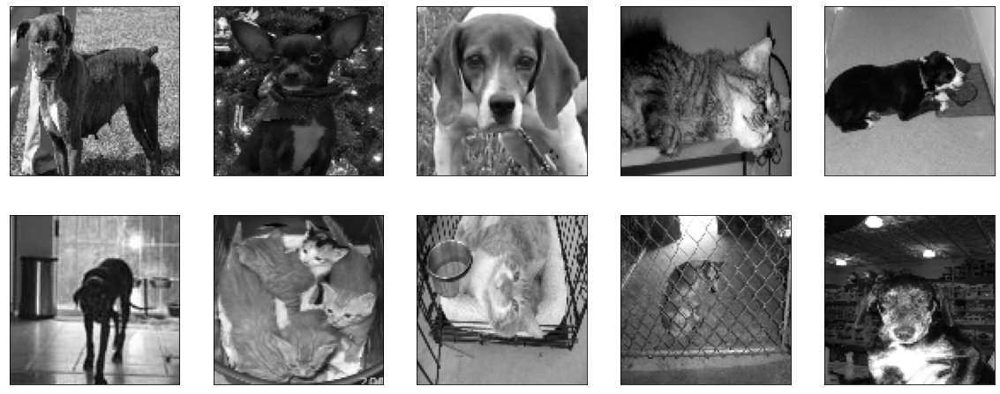

In [35]:
plt.figure(figsize=(20, 8))
for i in range(10):
  plt.subplot(2, 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.imshow(x[i].reshape(100, 100), cmap="gray")

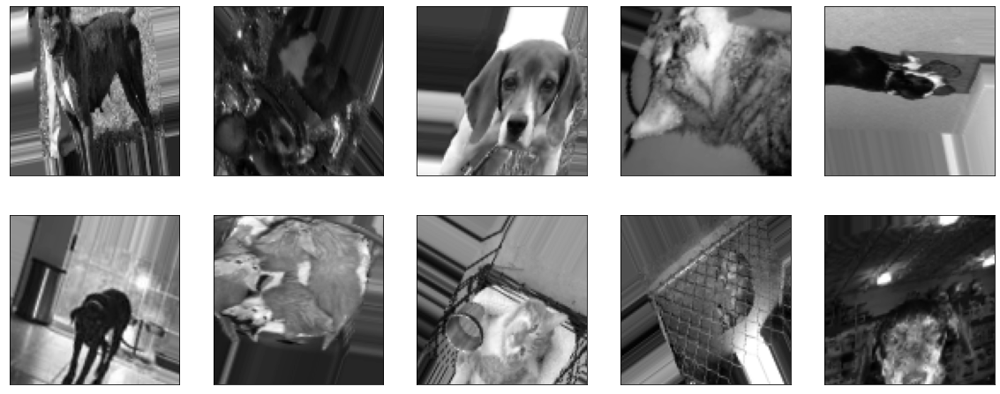

In [46]:
#using data augmentation in the generator
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    width_shift_range=.2, #to move the images
    height_shift_range=.2, #to move the images
    rotation_range=30, #random rotation in images
    shear_range=15, #incline the images
    zoom_range=[.7, 1.4],
    vertical_flip=True,
    horizontal_flip=True
)

datagen.fit(x)

plt.figure(figsize=(20,8))

for imagen, etiqueta in datagen.flow(x, y, batch_size=10, shuffle=False):
  for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(imagen[i].reshape(100, 100), cmap="gray")
  break#we only need one iteration

In [47]:
modeloDenso_AD = tf.keras.models.Sequential([
  tf.keras.layers.Flatten(input_shape=(100, 100, 1)),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(150, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid') #one output layer, one neuron with a sigmoid value (0, 1)
])

#a second model, CNN
modeloCNN_AD = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(100, activation='relu'),
  tf.keras.layers.Dense(1, activation='sigmoid')
])

modeloCNN2_AD = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(100, 100, 1)),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),
  tf.keras.layers.Conv2D(128, (3,3), activation='relu'),
  tf.keras.layers.MaxPooling2D(2, 2),

  tf.keras.layers.Dropout(0.5), #this model has a dropout
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(250, activation='relu'), #250 instead of 100
  tf.keras.layers.Dense(1, activation='sigmoid')
])

In [48]:
#to compile all of the models
modeloDenso_AD.compile(optimizer='adam',
                    loss='binary_crossentropy', #we're only using 0 and 1
                    metrics=['accuracy'])

modeloCNN_AD.compile(optimizer='adam',
                    loss='binary_crossentropy', 
                    metrics=['accuracy'])

modeloCNN2_AD.compile(optimizer='adam',
                    loss='binary_crossentropy', 
                    metrics=['accuracy'])

In [50]:
len(x) * .85 #19700 for training
len(x) - 19700 #3562

x_entrenamiento = x[:19700]
x_validacion = x[19700:]

y_entrenamiento = y[:19700]
y_validacion = y[19700:]

In [51]:
data_gen_entrenamiento = datagen.flow(x_entrenamiento, y_entrenamiento, batch_size=32)

In [52]:
tensorboardDenso_AD = TensorBoard(log_dir='logs/denso_AD')

modeloDenso_AD.fit(
    data_gen_entrenamiento,
    epochs=100, batch_size=32,
    validation_data=(x_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(x_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(x_validacion) / float(32))),
    callbacks=[tensorboardDenso_AD]
)

Epoch 1/100
616/616 [==============================] - 26s 41ms/step - loss: 0.7293 - accuracy: 0.5058 - val_loss: 0.7006 - val_accuracy: 0.5017
Epoch 2/100
616/616 [==============================] - 25s 40ms/step - loss: 0.6907 - accuracy: 0.5219 - val_loss: 0.6898 - val_accuracy: 0.5345
Epoch 3/100
616/616 [==============================] - 25s 41ms/step - loss: 0.6914 - accuracy: 0.5178 - val_loss: 0.6903 - val_accuracy: 0.5020
Epoch 4/100
616/616 [==============================] - 25s 40ms/step - loss: 0.6910 - accuracy: 0.5209 - val_loss: 0.6915 - val_accuracy: 0.5109
Epoch 5/100
616/616 [==============================] - 25s 41ms/step - loss: 0.6929 - accuracy: 0.5134 - val_loss: 0.6934 - val_accuracy: 0.4975
Epoch 6/100
616/616 [==============================] - 25s 41ms/step - loss: 0.6925 - accuracy: 0.5072 - val_loss: 0.6883 - val_accuracy: 0.5348
Epoch 7/100
616/616 [==============================] - 25s 40ms/step - loss: 0.6909 - accuracy: 0.5209 - val_loss: 0.6912 - val_ac

In [53]:
# to free some RAM memory
import gc
gc.collect()

1301

In [54]:
tensorboardCNN_AD = TensorBoard(log_dir='logs/cnn_AD')

modeloCNN_AD.fit(
    data_gen_entrenamiento,
    epochs=100, batch_size=32,
    validation_data=(x_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(x_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(x_validacion) / float(32))),
    callbacks=[tensorboardCNN_AD]
)
#this one results to be more precise, validation and training stay similar
#it slightly ends up being the best one

Epoch 1/100
616/616 [==============================] - 32s 51ms/step - loss: 0.6796 - accuracy: 0.5630 - val_loss: 0.6570 - val_accuracy: 0.6196
Epoch 2/100
616/616 [==============================] - 29s 48ms/step - loss: 0.6593 - accuracy: 0.6096 - val_loss: 0.6726 - val_accuracy: 0.5825
Epoch 3/100
616/616 [==============================] - 30s 49ms/step - loss: 0.6434 - accuracy: 0.6334 - val_loss: 0.6717 - val_accuracy: 0.5671
Epoch 4/100
616/616 [==============================] - 30s 48ms/step - loss: 0.6271 - accuracy: 0.6497 - val_loss: 0.6262 - val_accuracy: 0.6536
Epoch 5/100
616/616 [==============================] - 31s 50ms/step - loss: 0.6151 - accuracy: 0.6591 - val_loss: 0.6049 - val_accuracy: 0.6662
Epoch 6/100
616/616 [==============================] - 29s 48ms/step - loss: 0.6016 - accuracy: 0.6742 - val_loss: 0.5657 - val_accuracy: 0.6982
Epoch 7/100
616/616 [==============================] - 29s 46ms/step - loss: 0.5861 - accuracy: 0.6888 - val_loss: 0.5670 - val_ac

In [2]:
tensorboardCNN2_AD = TensorBoard(log_dir='logs/cnn2_AD')

modeloCNN2_AD.fit(
    data_gen_entrenamiento,
    epochs=100, batch_size=32,
    validation_data=(x_validacion, y_validacion),
    steps_per_epoch=int(np.ceil(len(x_entrenamiento) / float(32))),
    validation_steps=int(np.ceil(len(x_validacion) / float(32))),
    callbacks=[tensorboardCNN2_AD]
)

NameError: ignored

In [ ]:
#to export the model
modeloCNN_AD.save('perros-gatos-cnn-ad.h5')

In [ ]:
!pip install tensorflowjs

In [ ]:
!mkdir carpeta_salids

In [ ]:
!tensorflowjs_converter --input_format keras perros-gatos-cnn-ad.h5 carpeta_salida